In [1]:
import faiss
import numpy as np
import cv2
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
import json
import time
import matplotlib.pyplot as plt

from tqdm import tqdm

In [2]:
# 1. Load pre-trained VGG16 without top layers
model = VGG16(weights='imagenet', include_top=False, pooling='avg')

# 2. Feature extraction function
def extract_features(image_info):
    try:
    
        img = cv2.imread(image_info['path'])
        img = cv2.resize(img, (224, 224))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)
        features = model.predict(x, verbose=0)
        return features.flatten()
    
    except Exception as e:
           print(f"Error extracting features from {image_info['path']} : {str(e)}")
           return None

In [3]:
# prepare images dataset
with open('../sources/metadata/image_database.json', 'r') as f:
    image_database = json.load(f)

all_features = []
start_time = time.time()

for image_info in tqdm(image_database, 
                           desc=f"Processing", 
                           unit="image"):
        
    feature = image_info['feature']
    if feature is not None and len(feature) == 512:
        all_features.append(feature)
    
print(f"feature extraction duration: {time.time() - start_time}")

all_features = np.array(all_features).astype('float32')

np.save('../sources/metadata/image_features.npy', all_features)

Processing: 100%|██████████| 6140/6140 [00:00<00:00, 1023407.51image/s]


feature extraction duration: 0.2369999885559082


In [4]:
dimension = all_features.shape[1]  # Dimension of feature vectors
index = faiss.IndexFlatL2(dimension)  # Using L2 distance
index.add(all_features)  # Add vectors to the index
faiss.write_index(index, r'D:\image_search_engine_ai-end\sources\metadata\faiss_similar_features_index.idx')

In [4]:
# 5. Create FAISS index
# dimension = features.shape[1]  # Dimension of feature vectors
# index = faiss.IndexFlatL2(dimension)  # Using L2 distance
# index.add(features)  # Add vectors to the index

# 1. Create IVF index
nlist = 100 # Number of clusters
quantizer = faiss.IndexFlatL2(all_features.shape[1])
index = faiss.IndexIVFFlat(quantizer, all_features.shape[1], nlist)
index.train(all_features)
index.add(all_features)

# # Save the FAISS index
# faiss.write_index(index, 'faiss_index.idx')

In [7]:
# 6. Search for similar images
query_image = image_database[0]
query_features = extract_features(query_image).reshape(1, -1)
k = 20 # Number of similar images to retrieve
D, I = index.search(query_features, k)  # D = distances, I = indices

# Print similar images
print(image_database[0])
print("Most similar images:")
for i in I[0]:
    print(image_database[i]['path'])

{'folder': 'cake_party', 'path': 'D:\\image_search_engine_ai-end\\sources\\photos\\cake_party\\000002.jpg', 'caption': 'a photography of a cake with a lit candle on top of it', 'feature': [0.425487756729126, 0.0, 7.621761322021484, 16.158058166503906, 5.520186424255371, 0.7487788200378418, 0.26037776470184326, 0.0, 0.0, 4.91393518447876, 0.16833439469337463, 0.0, 1.7437180280685425, 0.0, 2.20169997215271, 8.810619354248047, 5.522627353668213, 1.7492470741271973, 1.1305242776870728, 0.0, 0.0, 0.0, 0.3307936191558838, 4.859374523162842, 0.7648836970329285, 4.527331352233887, 3.401860475540161, 0.13190476596355438, 4.371217250823975, 0.02557952143251896, 3.808875322341919, 0.0, 5.988768100738525, 0.0, 11.44153118133545, 0.442473441362381, 3.0004384517669678, 4.422414779663086, 0.0, 0.0, 2.2065865993499756, 1.2378263473510742, 1.3326892852783203, 12.767729759216309, 14.168819427490234, 6.612922668457031, 1.249584436416626, 0.0, 0.06625492870807648, 1.1220767498016357, 0.0, 0.05589434877038

In [8]:
# 2. Get cluster assignments for all vectors
_, cluster_ids = index.quantizer.search(all_features, 1)  # Find nearest centroid for each vector
cluster_ids = cluster_ids.squeeze()  # Remove extra dimension

# Save cluster IDs

np.save('../sources/metadata/cluster_ids.npy', cluster_ids)

In [9]:
len(all_features)

6130

In [ ]:
# save cluster ids
for image_info, cluster_id in zip(image_database, cluster_ids):
    image_info['cluster_id'] = int(cluster_id)
    
    
# save cluster ids
for image_info in image_database:
    if "cluster_id" not in list(image_info.keys()):
        image_info['cluster_id'] = -1
    

In [11]:
with open('../sources/metadata/image_database.json', 'w') as f:
    json.dump(image_database, f, indent=4)

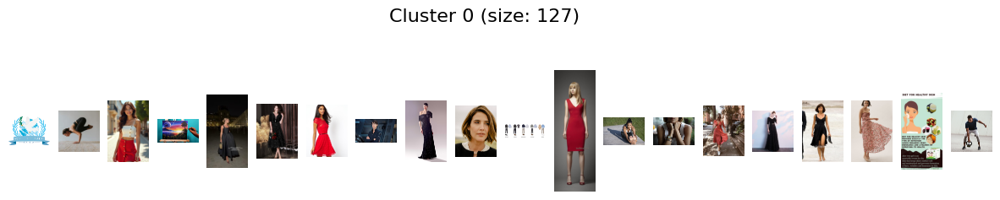

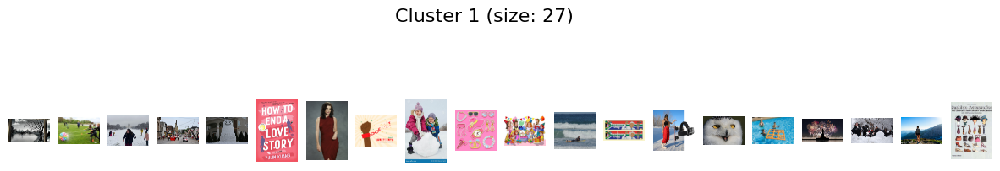

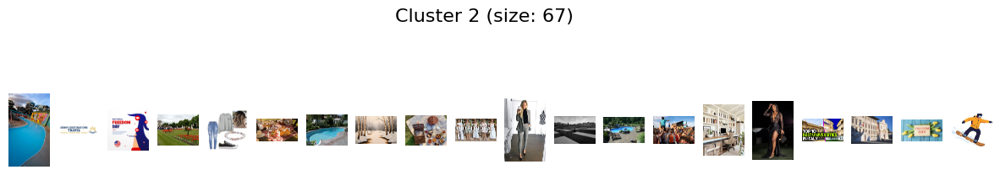

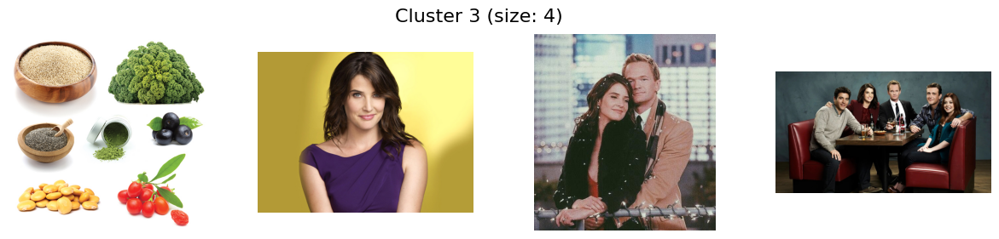

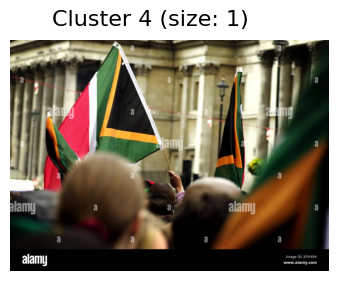

Error display D:\image_search_engine_ai-end\sources\photos\screenshot\screenshot_000265.png : not a PNG file


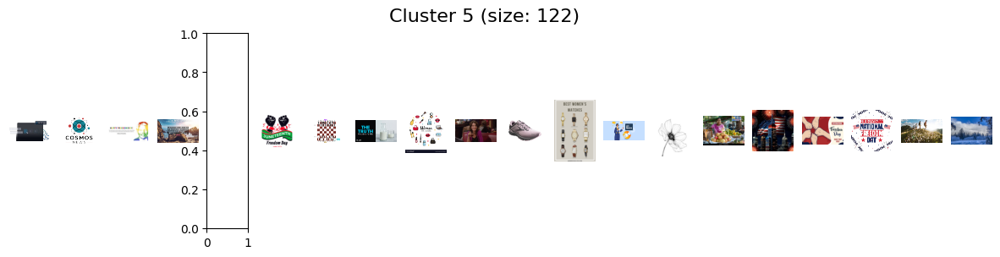

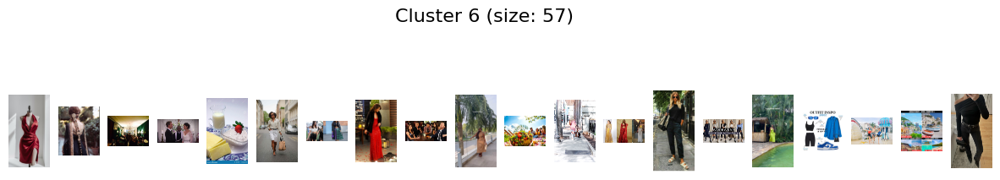

Error display D:\image_search_engine_ai-end\sources\photos\screenshot\000390.png : not a PNG file


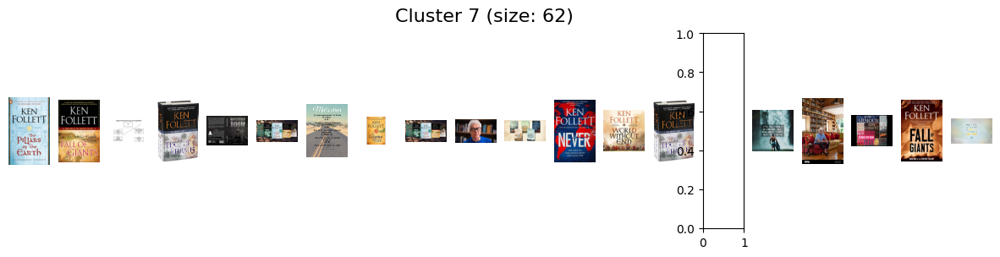

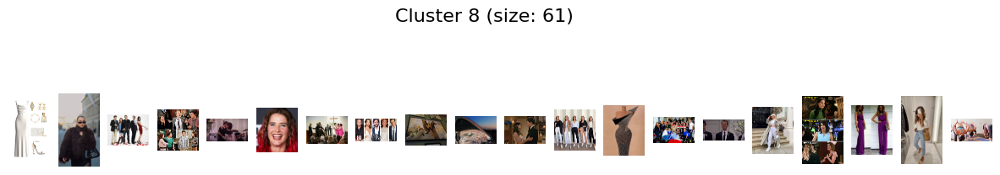

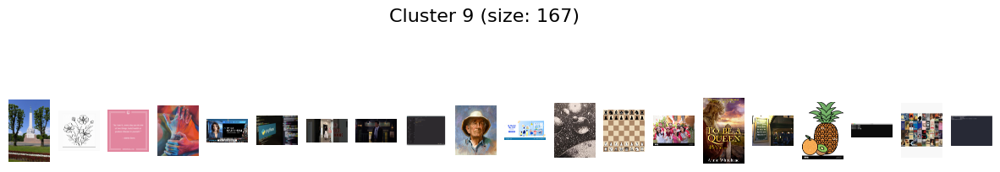

Error display D:\image_search_engine_ai-end\sources\photos\media\001616.jpg : broken data stream when reading image file


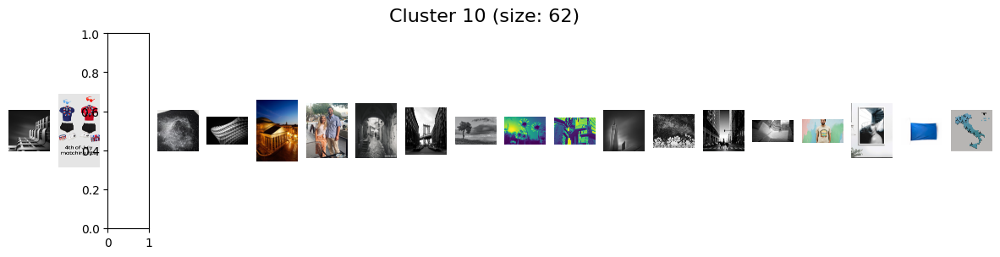

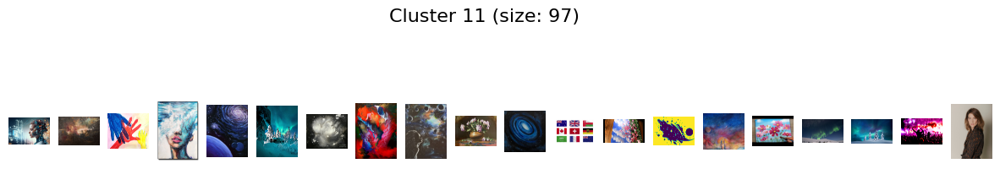

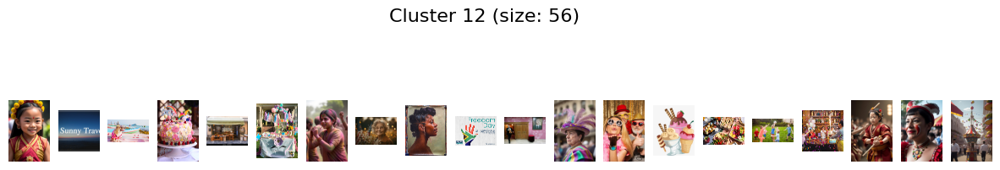

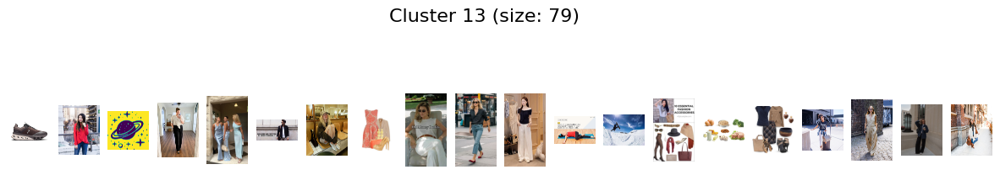

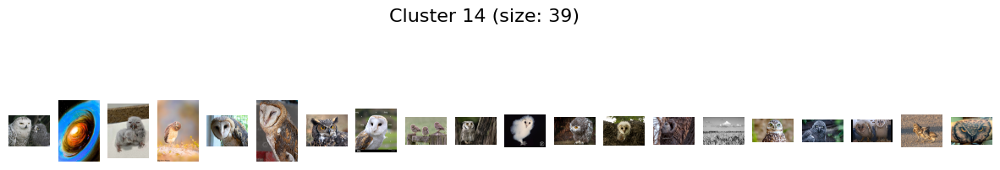

...

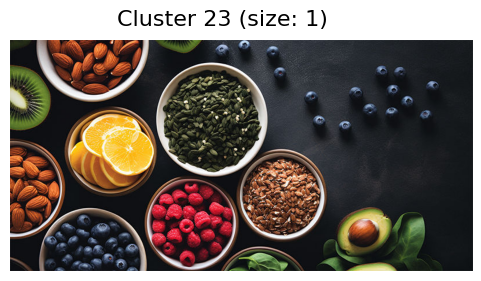

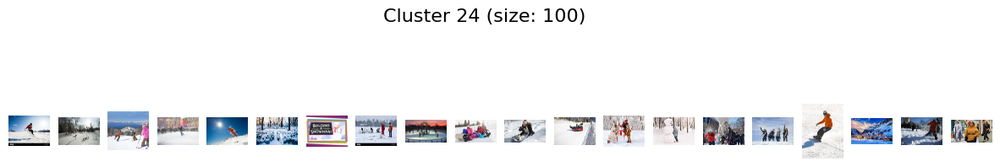

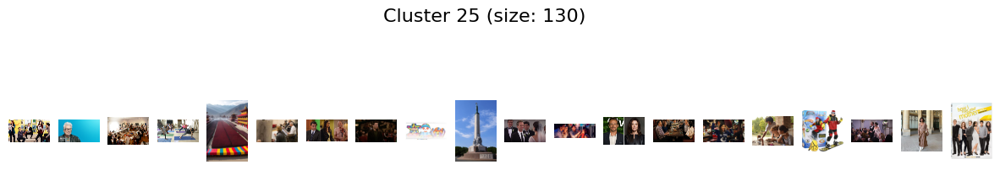

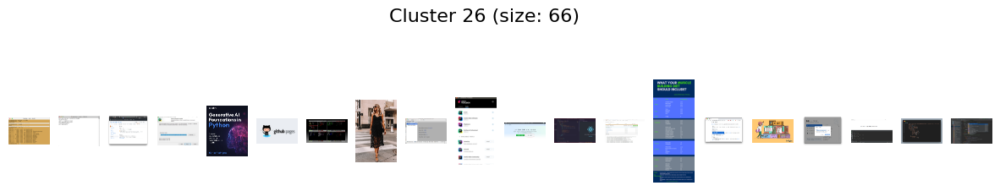

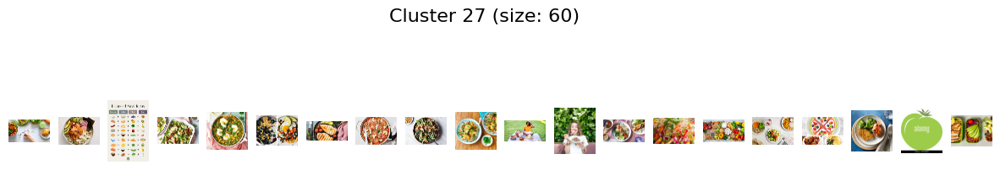

Error display D:\image_search_engine_ai-end\sources\photos\media\000694.png : not a PNG file


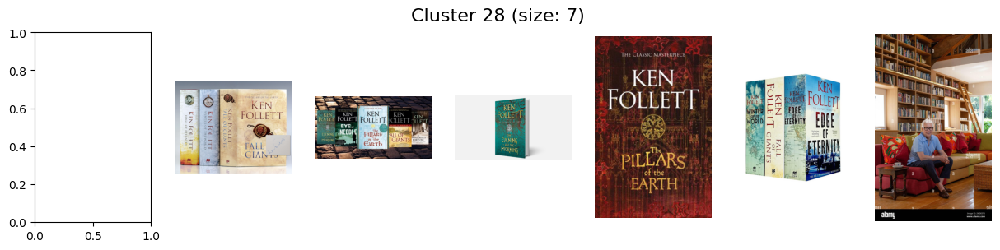

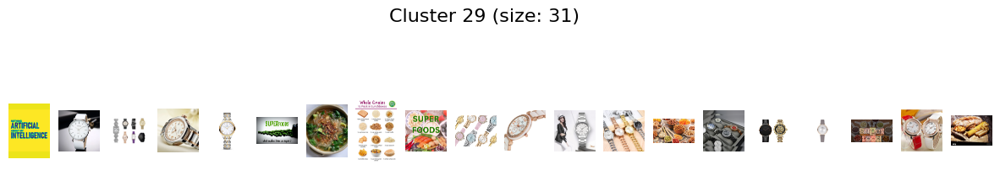

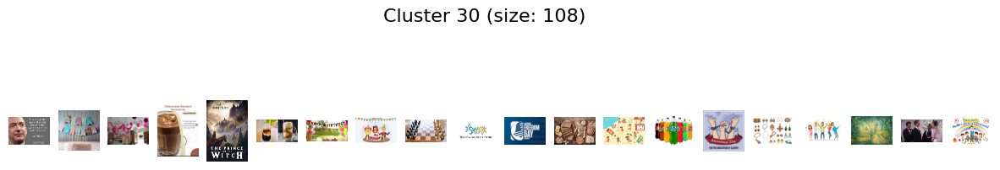

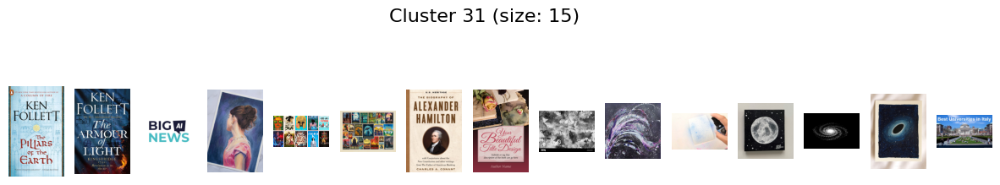

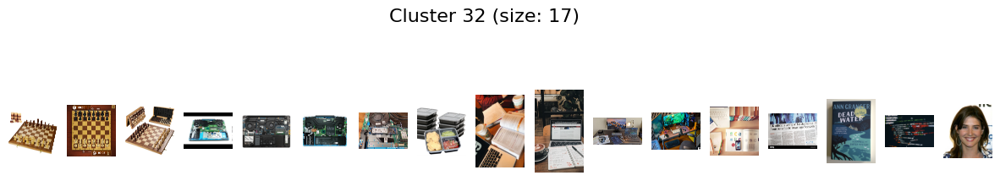

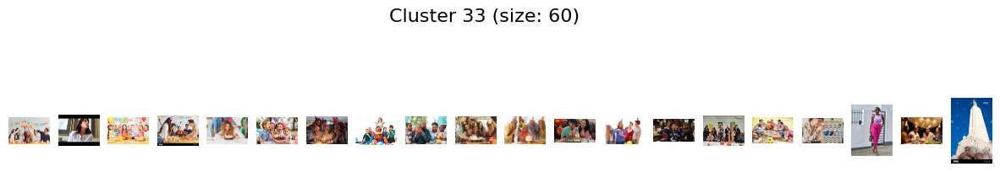

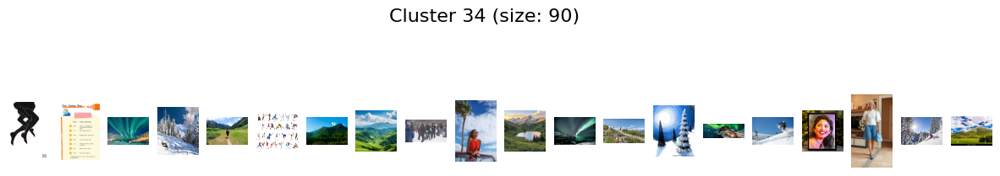

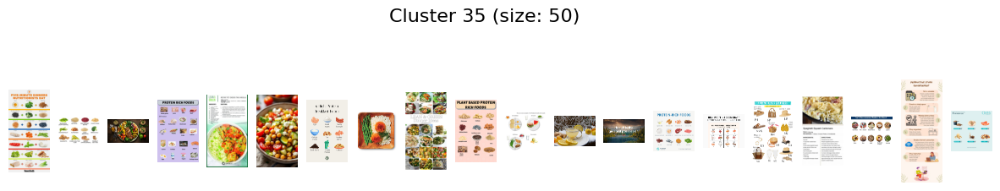

Error display D:\image_search_engine_ai-end\sources\photos\summer\000218.jpg : image file is truncated (4 bytes not processed)


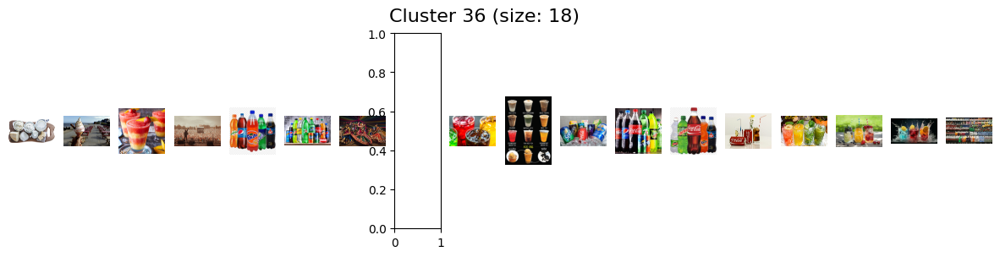

Error display D:\image_search_engine_ai-end\sources\photos\screenshot\screenshot_000253.png : not a PNG file


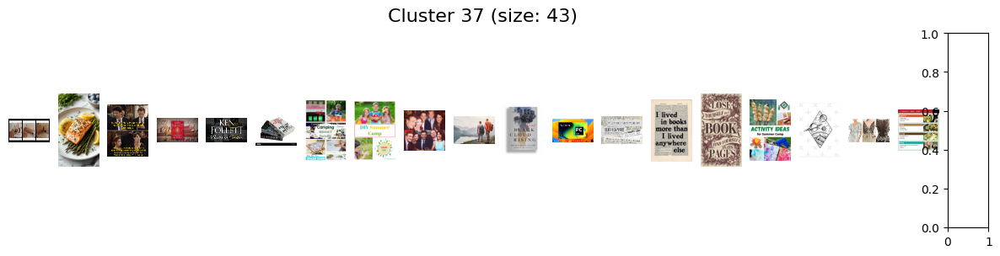

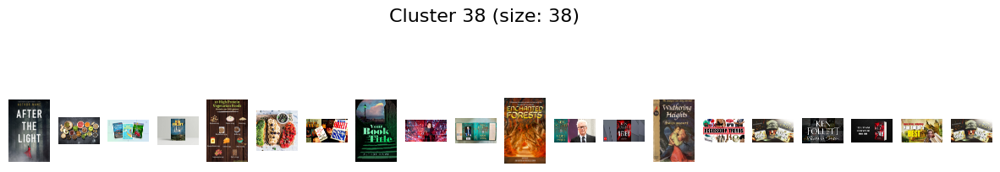

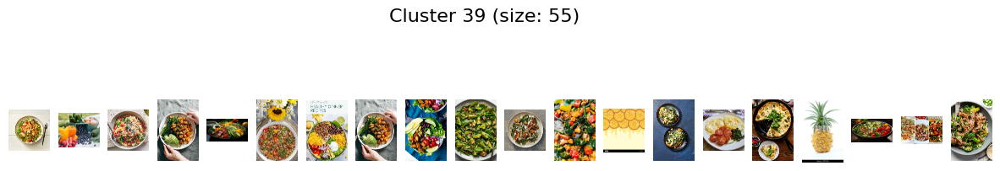

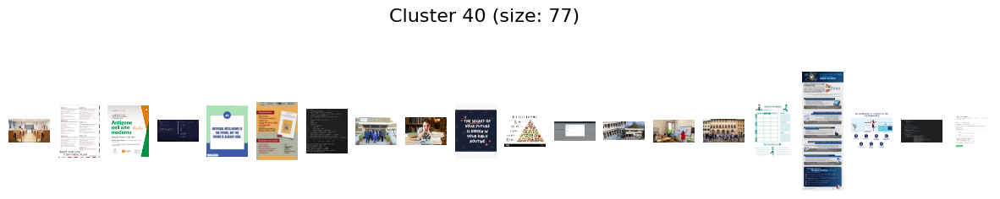

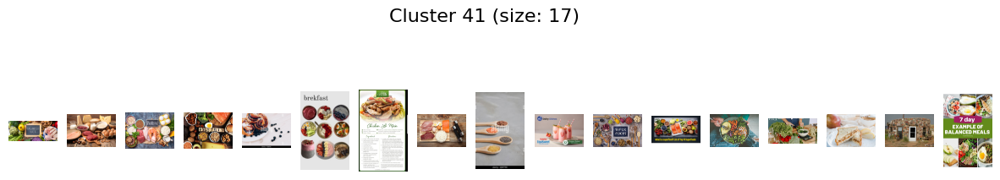

...

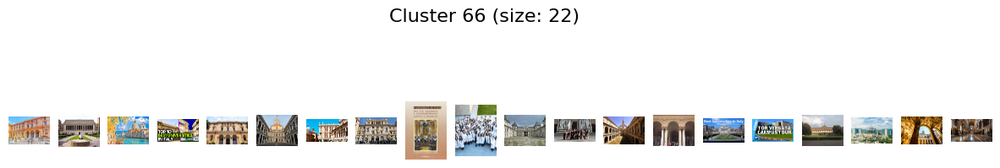

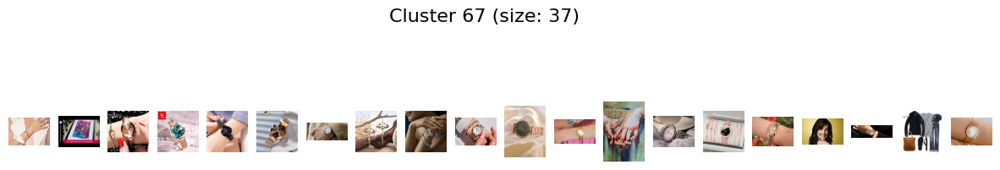

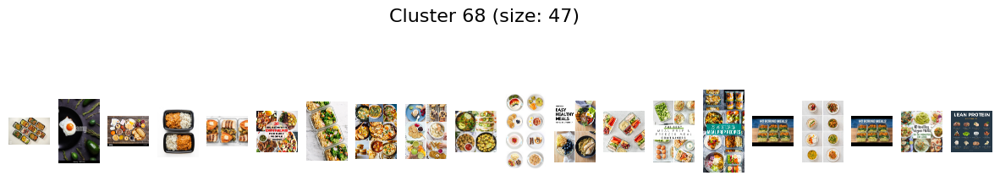

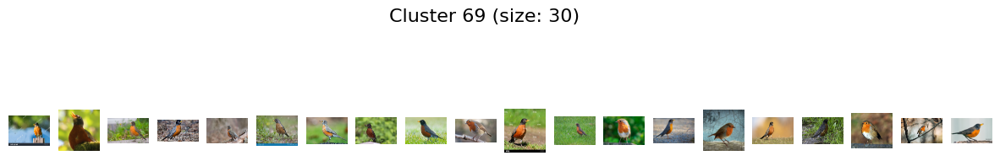

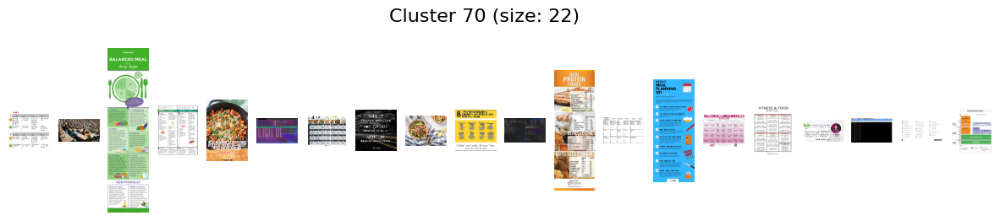

KeyboardInterrupt: 

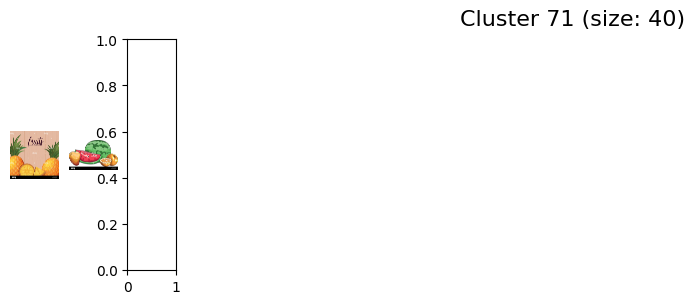

In [14]:
# 3. Visualize clusters
def show_cluster(cluster_id, num_samples=20):
    cluster_mask = (cluster_ids == cluster_id)
    # cluster_images = np.array(image_database)[cluster_mask]
    cluster_images = [image_info for image_info in image_database if image_info['cluster_id'] == cluster_id]
    
    # Randomly sample images from cluster
    if len(cluster_images) > num_samples:
        cluster_images = np.random.choice(cluster_images, num_samples, replace=False)
    
    # Display images
    plt.figure(figsize=(15, 3))
    plt.suptitle(f"Cluster {cluster_id} (size: {np.sum(cluster_mask)})", fontsize=16)
    
    for i, image_info in enumerate(cluster_images, 1):
        try:
            plt.subplot(1, len(cluster_images), i)
            img = plt.imread(image_info['path'])
            plt.imshow(img)
            plt.axis('off')
        except Exception as e:
            print(f"Error display {image_info['path']} : {str(e)}")
    plt.show()

# 4. Show all clusters
for cluster_id in range(nlist):
    show_cluster(cluster_id)

In [ ]:
# # Load features
# features = np.load('image_features.npy')

# # Load FAISS index
# index = faiss.read_index('faiss_index.idx')

# # Load cluster IDs
# cluster_ids = np.load('cluster_ids.npy')

# # Load metadata (optional)
# with open('image_metadata.json', 'r') as f:
#     image_metadata = json.load(f)